In [1]:
import numpy as np
import pandas as pd

In [2]:
import scipy
import sklearn

Data Importing & Cleaning

In [3]:
data = pd.read_csv('VIX_data.csv')

In [4]:
data.head()

,Date,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,...,USD INDEX Open,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,VXN Open,VXN High,VXN Low,VXN Close,VXN Adj Close
0,2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,16.530,...,85.910004,87.129997,84.470001,86.879997,86.879997,18.260000,31.170000,15.310000,15.810000,15.810000
1,2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,...,87.080002,88.440002,86.879997,88.360001,88.360001,15.740000,17.180000,13.480000,14.740000,14.740000
2,2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,...,88.230003,90.330002,87.629997,90.269997,90.269997,14.740000,24.080000,14.300000,19.639999,19.639999
3,2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,...,90.360001,95.480003,90.330002,94.800003,94.800003,19.730000,23.700001,16.389999,21.590000,21.590000
4,2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,13.300,...,98.419998,99.989998,94.400002,94.599998,94.599998,17.360001,18.639999,13.510000,16.510000,16.510000


In [5]:
data.shape

(103, 62)

In [6]:
total_check = data.isnull().sum() + (data== '').sum()
has_missing_data = total_check.sum() >0
print(has_missing_data)

False


In [7]:
data.index = pd.to_datetime(data['Date'])

In [8]:
numeric_columns = data.select_dtypes(include=[np.number]).columns
column_means = data[numeric_columns].mean()

data_filled = data.copy()
data_filled[numeric_columns].fillna(column_means)

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,GDP,...,USD INDEX Open,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,VXN Open,VXN High,VXN Low,VXN Close,VXN Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,16.530,17912.079,...,85.910004,87.129997,84.470001,86.879997,86.879997,18.260000,31.170000,15.310000,15.810000,15.810000
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,17912.079,...,87.080002,88.440002,86.879997,88.360001,88.360001,15.740000,17.180000,13.480000,14.740000,14.740000
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,17912.079,...,88.230003,90.330002,87.629997,90.269997,90.269997,14.740000,24.080000,14.300000,19.639999,19.639999
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,18063.529,...,90.360001,95.480003,90.330002,94.800003,94.800003,19.730000,23.700001,16.389999,21.590000,21.590000
2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,13.300,18279.784,...,98.419998,99.989998,94.400002,94.599998,94.599998,17.360001,18.639999,13.510000,16.510000,16.510000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01,3.9,313.207,5.24,5.15,4.54,5.33,5.84,5108.065,15.745,29016.714,...,104.489998,106.519997,103.879997,106.220001,106.220001,17.590000,23.340000,16.340000,18.430000,18.430000
2024-05-01,4.0,313.225,5.25,5.17,4.48,5.33,5.75,5256.815,12.920,29016.714,...,106.320000,106.489998,104.080002,104.669998,104.669998,20.150000,20.230000,14.670000,16.700001,16.700001
2024-06-01,4.1,313.049,5.24,5.15,4.31,5.33,5.63,5433.740,12.645,29016.714,...,104.629997,106.129997,103.989998,105.870003,105.870003,16.830000,17.980000,6.480000,16.240000,16.240000


In [9]:
VIX_data = data_filled['VIX']

In [10]:
if isinstance(VIX_data, pd.Series):
    VIX = VIX_data.to_frame(name='VIX')

In [11]:
data_interim = data_filled.reset_index(drop=True)
data_interim.set_index('Date', inplace=True)

data_interim.index = pd.to_datetime(data_interim.index)

In [12]:
t = data_interim.isnull().sum()
t.isnull().sum()

0

In [13]:
Features = data_interim.drop('VIX', axis=1)

In [14]:
Features.columns

Index(['Unemployment Rate', 'CPI', 'Three Month T Bill Rate',
       'Six Month T Bill Rate', '10-Year Treasury Constant Maturity Rate',
       'Fed Rate', 'BBB Rate', 'SP500 Index', 'GDP', 'Initial Claims',
       'JPY/USD Spot Rate', 'Total Nonfarm Employees', 'Spot Crude Oil Price',
       'SP500 Volume', 'NASDAQ Open', 'NASDAQ High', 'NASDAQ Low',
       'NASDAQ Close', 'NASDAQ Adj Close', 'NASDAQ Volume', 'DJI Open',
       'DJI High', 'DJI Low', 'DJI Close', 'DJI Adj Close', 'DJI Volume',
       'RUSSELL2000 Open', 'RUSSELL2000 High', 'RUSSELL2000 Low',
       'RUSSELL2000 Close', 'RUSSELL2000 Adj Close', 'RUSSELL2000 Volume',
       'FTSE Open', 'FTSE High', 'FTSE Low', 'FTSE Close', 'FTSE Adj Close',
       'FTSE Volume', 'NIKKEI Open', 'NIKKEI High', 'NIKKEI Low',
       'NIKKEI Close', 'NIKKEI Adj Close', 'NIKKEI Volume', 'GOLD Open',
       'GOLD High', 'GOLD Low', 'GOLD Close', 'GOLD Adj Close', 'GOLD Volume',
       'USD INDEX Open', 'USD INDEX High', 'USD INDEX Low', 'USD

In [15]:
Features_clean = Features[['Unemployment Rate', 'CPI', 'Three Month T Bill Rate', 'Six Month T Bill Rate', 
                           '10-Year Treasury Constant Maturity Rate', 'Fed Rate', 'BBB Rate', 'SP500 Index', 
                           'SP500 Volume', 'NASDAQ Adj Close','NASDAQ Volume','DJI Adj Close','DJI Volume', 
                           'RUSSELL2000 Adj Close','RUSSELL2000 Volume','FTSE Adj Close','FTSE Volume','NIKKEI Adj Close',
                           'NIKKEI Volume','GDP', 'Initial Claims', 'JPY/USD Spot Rate', 'Spot Crude Oil Price',
                           'GOLD Adj Close','GOLD Volume', 'USD INDEX Adj Close']]

In [16]:
Features_clean.isnull().sum()

Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims                             0
JPY/USD Spot Rate                          0
Spot Crude

In [17]:
isinstance(Features_clean, pd.DataFrame)

True

In [18]:
data_clean = pd.concat([VIX, Features_clean], axis=1, join='inner')

In [19]:
data_clean.shape

(103, 27)

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

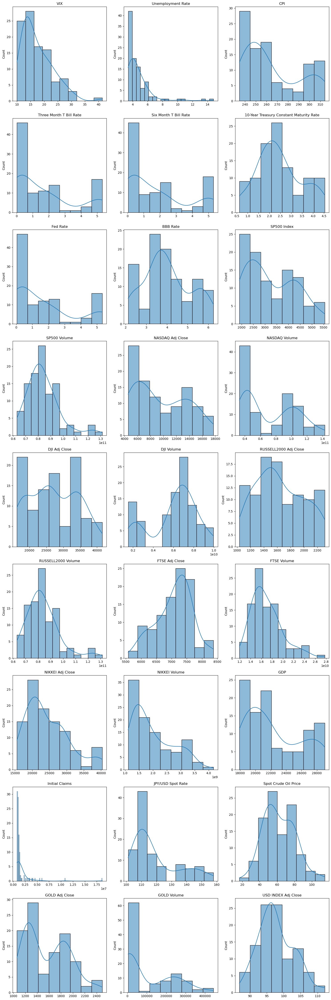

In [21]:
# plt.style.use('seaborn')

n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
# fig.suptitle('Histograms of all Features', fontsize=16)

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.histplot(data=data_clean, x=column, kde=True, bins='auto', ax=axes[i])
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

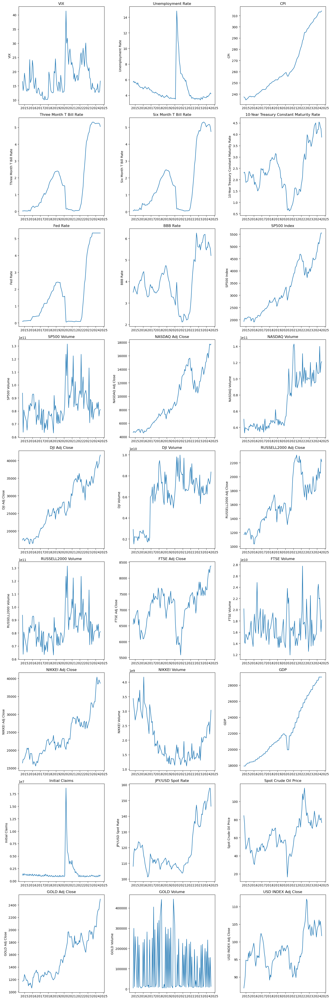

In [22]:
n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
# fig.suptitle('All Features', fontsize=16)

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.lineplot(data=data_clean, x=data_clean.index, y=column, ax=axes[i])
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [23]:
#Rolling statistics

def calculate_rolling_stats(df, window):
    rolling_mean = df.rolling(window=window).mean()
    rolling_std = df.rolling(window=window).std()
    return rolling_mean, rolling_std

In [24]:

window_size = 6

rolling_mean, rolling_std = calculate_rolling_stats(data_clean, window=window_size)

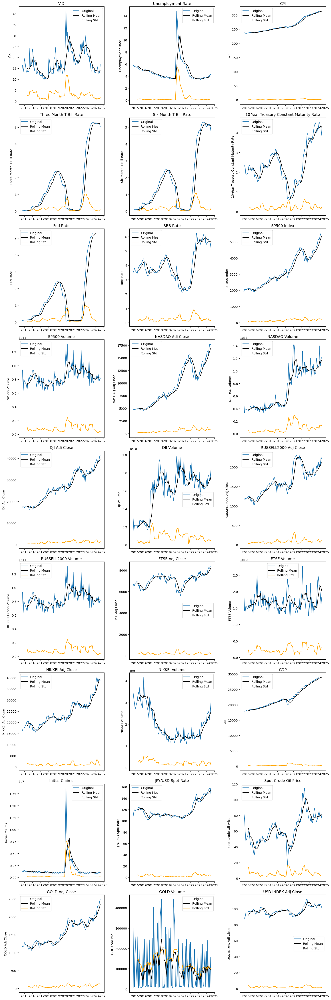

In [25]:

n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.lineplot(data=data_clean, x=data_clean.index, y=column, label='Original', ax=axes[i])
    sns.lineplot(data=rolling_mean, x=rolling_mean.index, y=rolling_mean[column], color='black', label='Rolling Mean', ax=axes[i])
    sns.lineplot(data=rolling_std, x=rolling_std.index, y=rolling_std[column], color='orange', label='Rolling Std', ax=axes[i])
    axes[i].legend(loc='best')
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [26]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [27]:
#Decompose

def decompose_and_plot(series, column, period):
    decomposition = seasonal_decompose(series, model='additive', period=period)

    fig = plt.figure(figsize=(15, 10))
    gs = fig.add_gridspec(2, 3)
    
    fig.suptitle(column, fontsize=20)
    

    #Plot original data
    ax_original = fig.add_subplot(gs[0, :])
    ax_original.plot(series)
    ax_original.set_title('Original')
    ax_original.set_xlabel('')

    #Plot trend
    ax_trend = fig.add_subplot(gs[1, 0])
    ax_trend.plot(decomposition.trend)
    ax_trend.set_title('Trend')

    #Plot seasonal
    ax_seasonal = fig.add_subplot(gs[1, 1])
    ax_seasonal.plot(decomposition.seasonal)
    ax_seasonal.set_title('Seasonal')

    #Plot residual
    ax_residual = fig.add_subplot(gs[1, 2])
    ax_residual.plot(decomposition.resid)
    ax_residual.set_title('Residual')

    plt.tight_layout()
    plt.show()



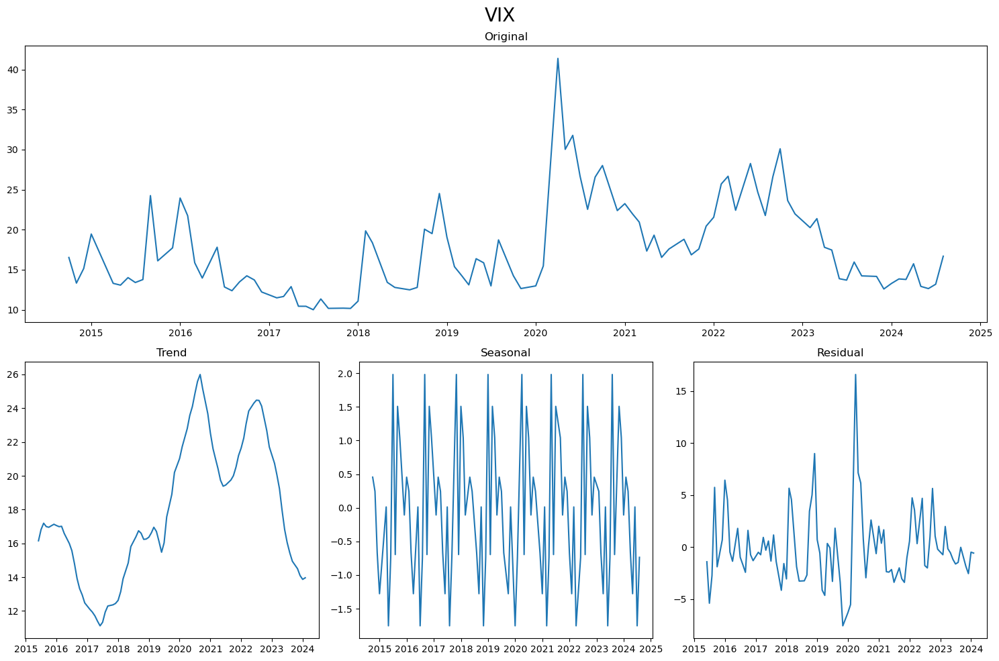

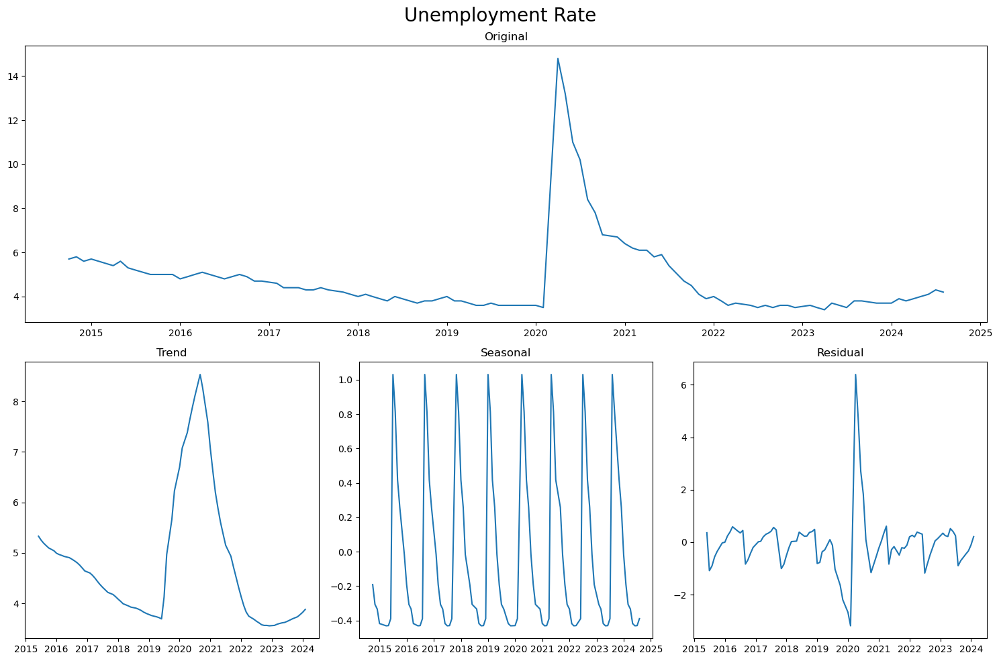

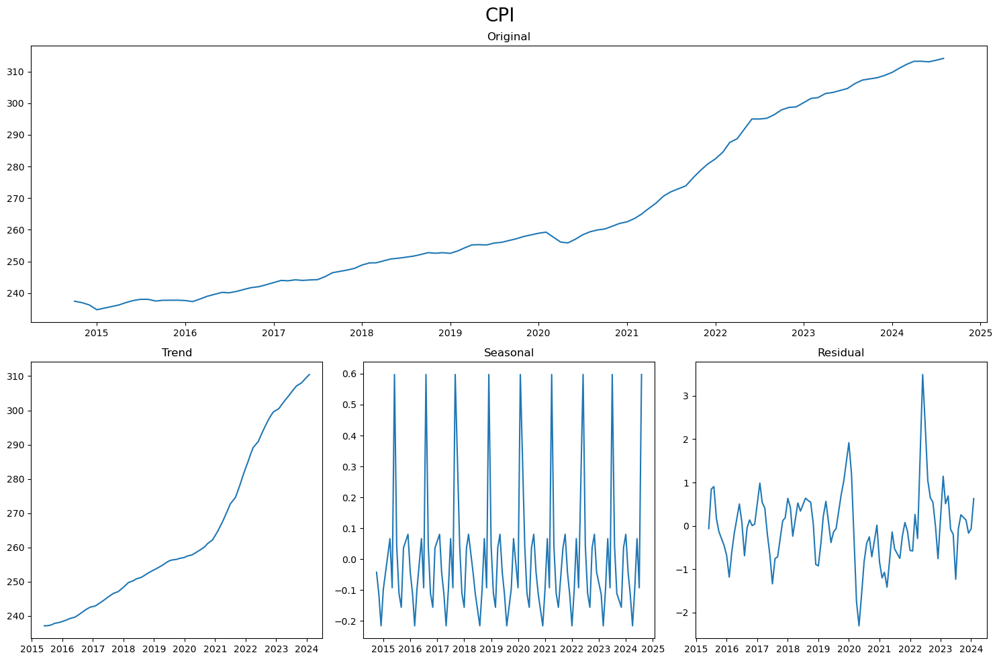

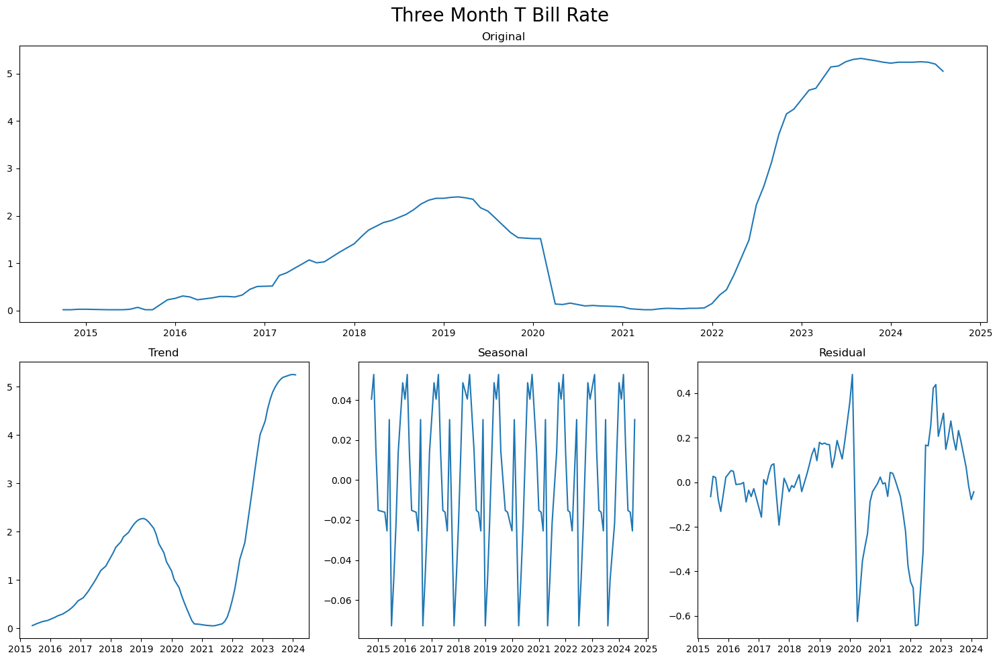

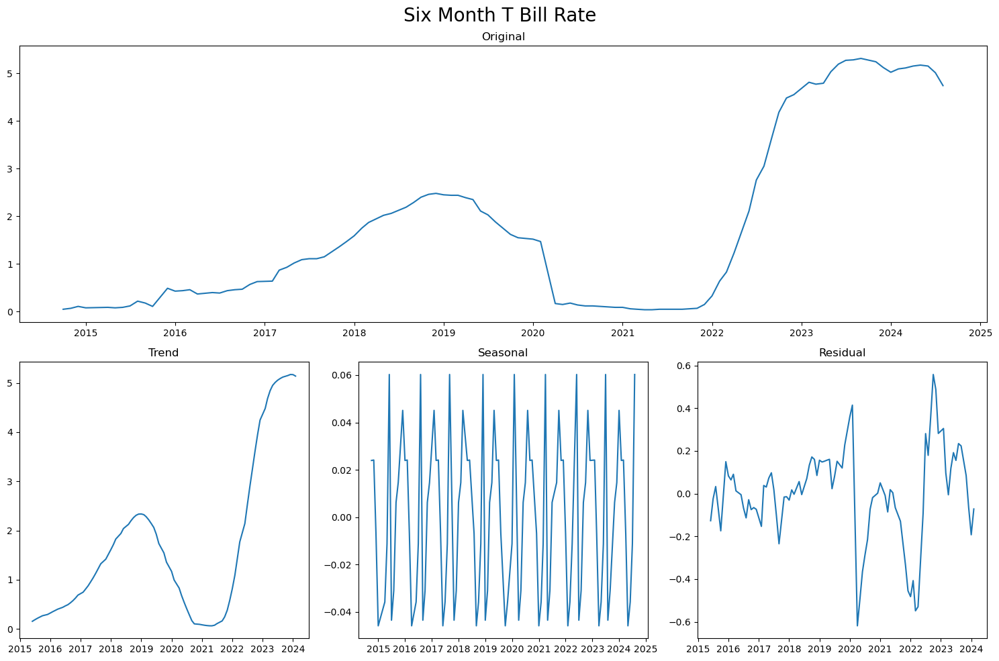

...

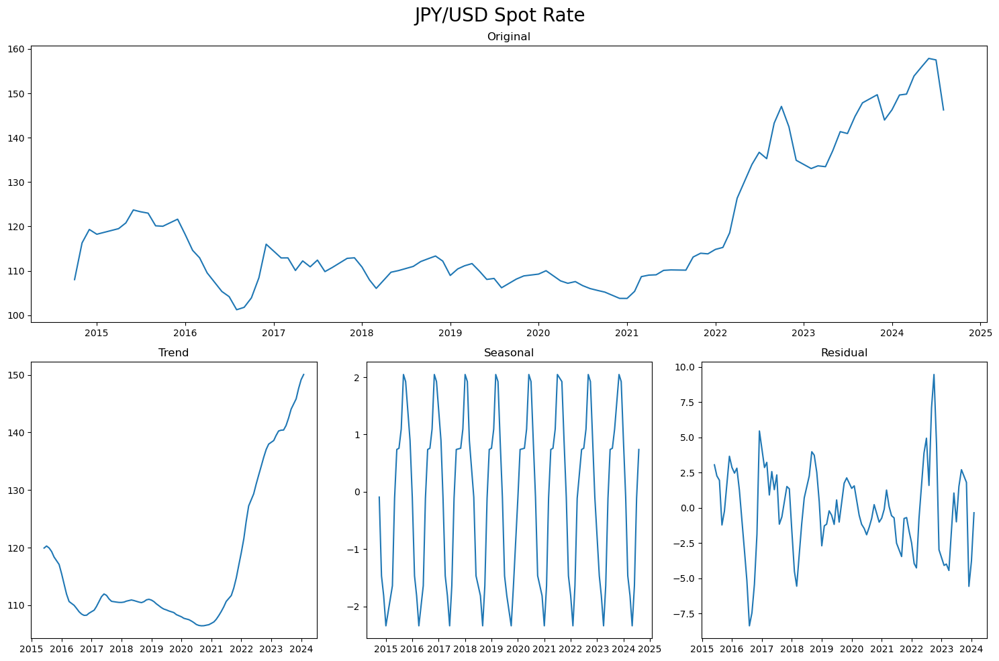

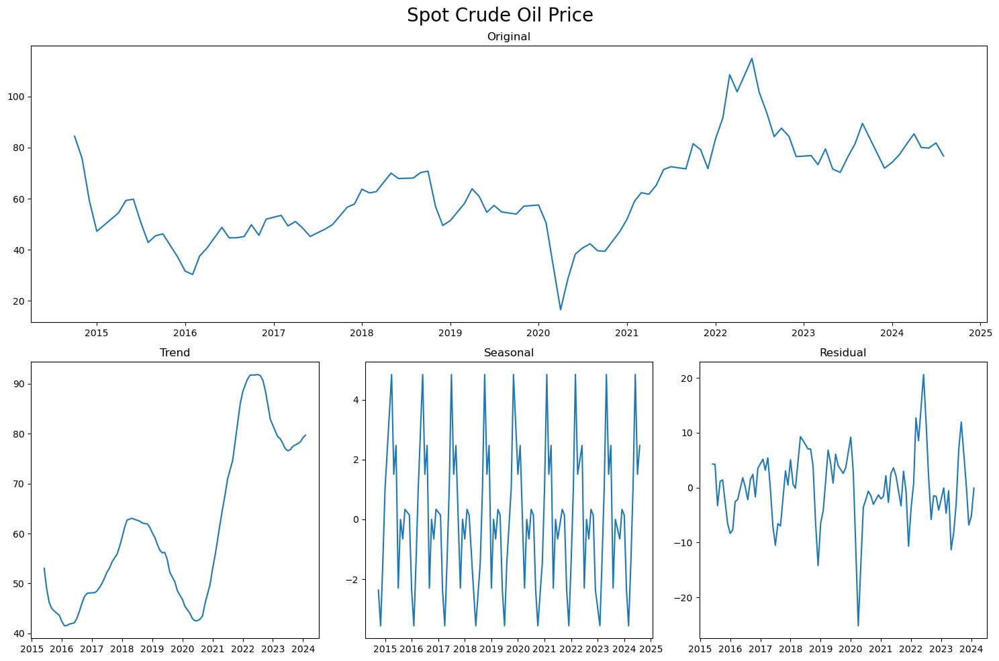

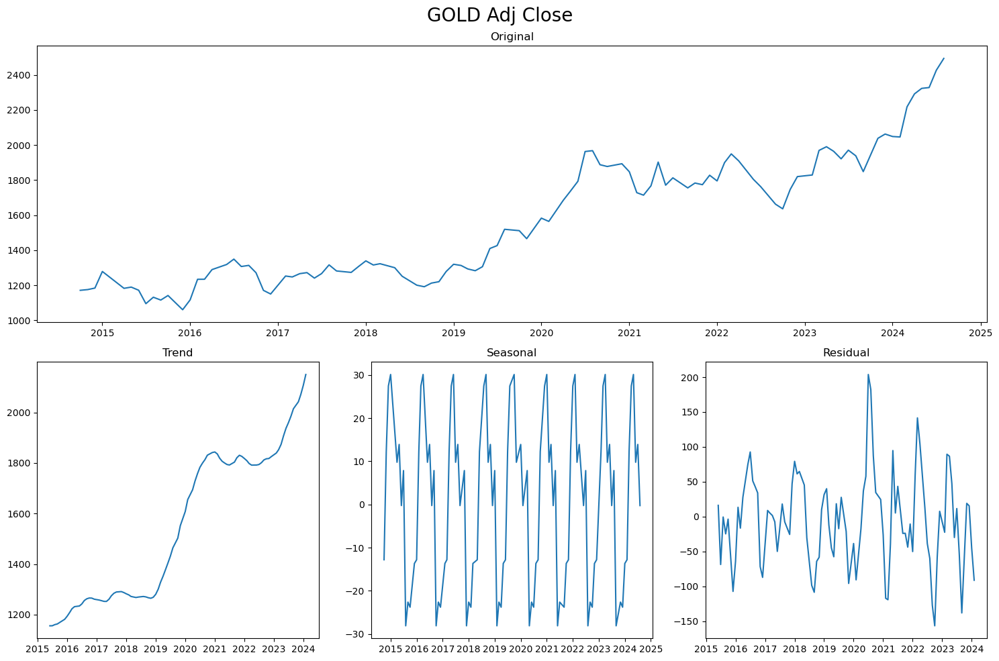

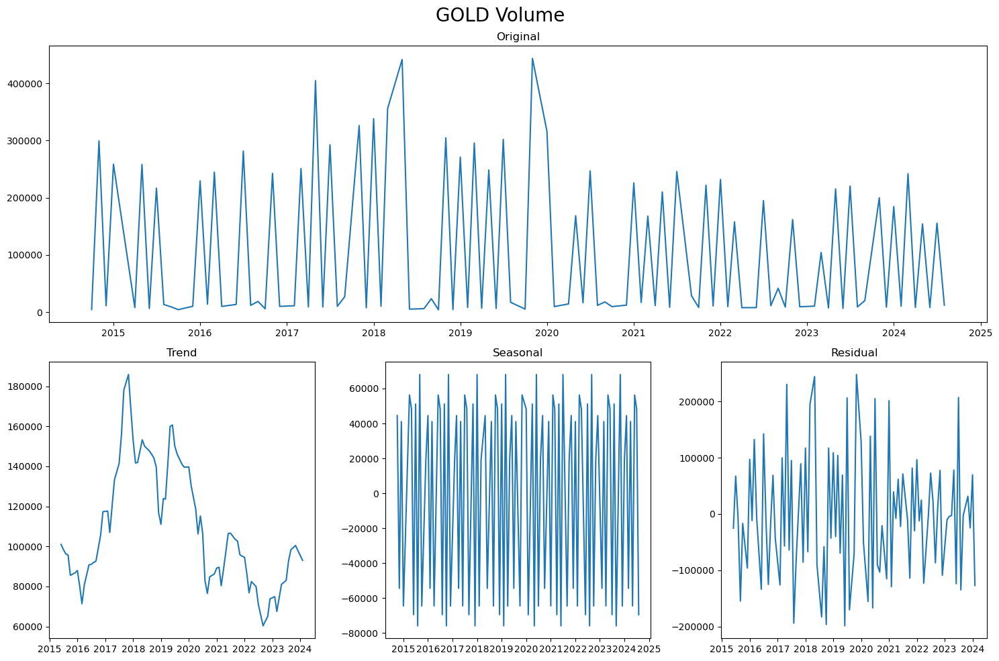

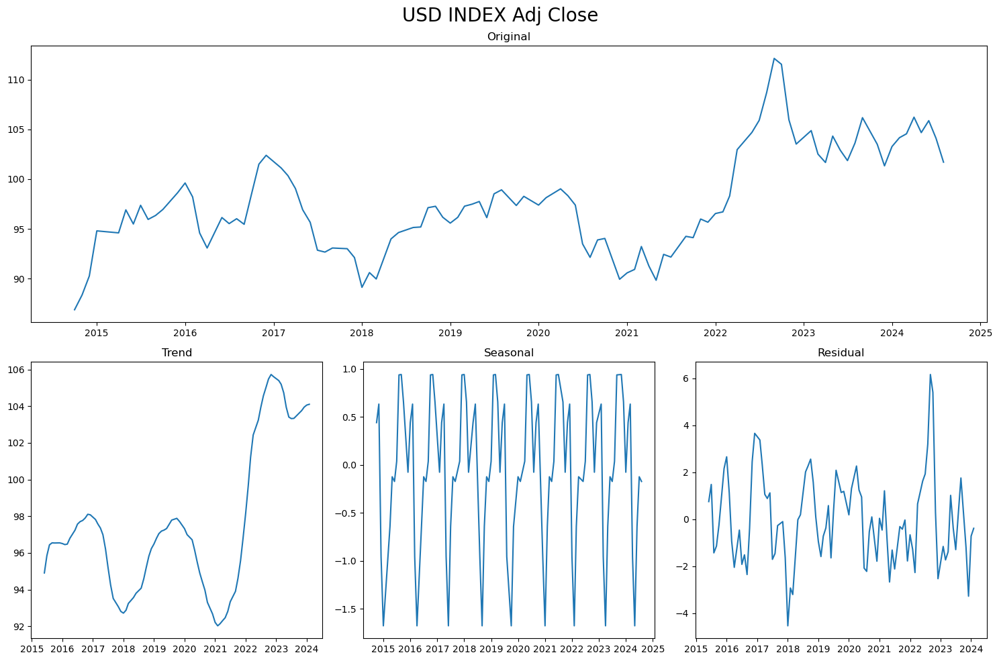

In [28]:
period = 12

for column in data_clean.columns:
    decompose_and_plot(data_clean[column], column, period)

In [29]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf

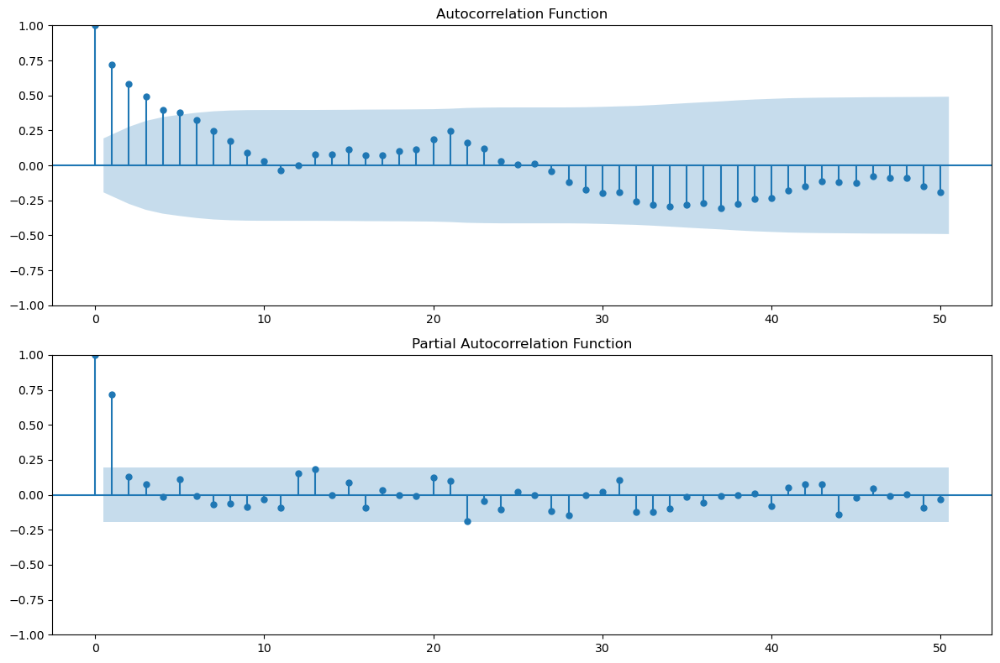

In [30]:
#ACF and PACF of original VIX data
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,8))

sm.graphics.tsa.plot_acf(data_clean['VIX'], lags=50, ax=ax1)
ax1.set_title('Autocorrelation Function')

sm.graphics.tsa.plot_pacf(data_clean['VIX'], lags=50, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

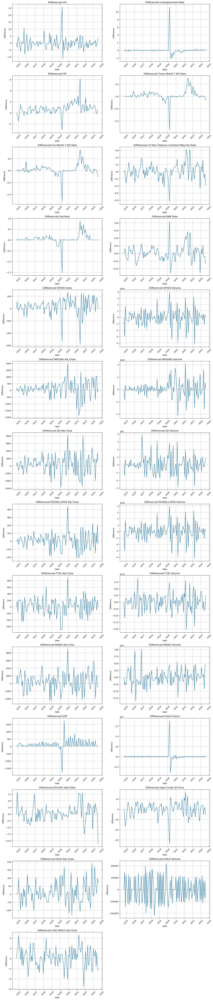

In [31]:
#Difference the Data

differenced_data = data_clean.diff() #First order differencing

differenced_data.iloc[0] = 0 #First entry of differenced data is typically NaN because there is no previous value to subtract from the first observation

num_columns = len(differenced_data.columns)

nrows = (num_columns + 1) // 2


plt.figure(figsize=(15, 5 * nrows))

for i, column in enumerate(differenced_data.columns):
    plt.subplot(nrows, 2, i + 1)
    plt.plot(differenced_data.index, differenced_data[column])
    plt.title(f'Differenced {column}')
    plt.xlabel('Date')
    plt.ylabel('Difference')
    plt.grid(True)
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()



In [32]:
#Check for NaN or infinite values

missing_values = differenced_data.isnull().sum() + (differenced_data == float('inf')).sum() + (differenced_data == float('-inf')).sum()
print(f'Number of missing or ifinite values: {missing_values}')

Number of missing or ifinite values: VIX                                        0
Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims    

In [33]:
from statsmodels.tsa.stattools import adfuller

In [34]:
#ADF / Augmented Dickey Fuller Test
def adfuller_test(series):
    adf_result = adfuller(series, autolag='AIC')
    return{
        'ADF Statistic': adf_result[0], 
        'p-value': adf_result[1],
        'Lags used': adf_result[2],
        'Observations used': adf_result[3],
        'Critical Values': adf_result[4]
        }

In [35]:
adf_results = differenced_data.apply(adfuller_test, axis=0)

In [36]:
adf_results.describe()

count                                                    27
unique                                                   27
top       {'ADF Statistic': -12.994877774073515, 'p-valu...
freq                                                      1
dtype: object

In [37]:
print(adf_results)

VIX                                        {'ADF Statistic': -12.994877774073515, 'p-valu...
Unemployment Rate                          {'ADF Statistic': -10.753585860668734, 'p-valu...
CPI                                        {'ADF Statistic': -4.778606942416463, 'p-value...
Three Month T Bill Rate                    {'ADF Statistic': -2.2457473179743075, 'p-valu...
Six Month T Bill Rate                      {'ADF Statistic': -2.773212010174554, 'p-value...
10-Year Treasury Constant Maturity Rate    {'ADF Statistic': -7.2908149953780725, 'p-valu...
Fed Rate                                   {'ADF Statistic': -2.5493826738826884, 'p-valu...
BBB Rate                                   {'ADF Statistic': -7.601264664281523, 'p-value...
SP500 Index                                {'ADF Statistic': -10.178219623329483, 'p-valu...
SP500 Volume                               {'ADF Statistic': -6.419780434213524, 'p-value...
NASDAQ Adj Close                           {'ADF Statistic': -4.454019

In [38]:
adf_results['VIX']

{'ADF Statistic': -12.994877774073515,
 'p-value': 2.763449691116139e-24,
 'Lags used': 0,
 'Observations used': 102,
 'Critical Values': {'1%': -3.4961490537199116,
  '5%': -2.8903209639580556,
  '10%': -2.5821223452518263}}

In [39]:
from statsmodels.tsa.stattools import kpss

In [40]:
import warnings
from statsmodels.tools.sm_exceptions import InterpolationWarning

In [41]:
#KPSS / Kwiatkowski-Phillips-Schmidt-Shin Test
def kpss_test(series, **kw):
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=InterpolationWarning)
    
        statistic, p_value, n_lags, critical_values = kpss(series, **kw)
    return{
        'KPSS Statistic': statistic,
        'p_value': p_value,
        'num lags': n_lags,
        'Critical Values': critical_values
    }

In [42]:
kpss_results = differenced_data.apply(kpss_test, axis=0)

In [43]:
print(kpss_results.iloc[:1])

VIX    {'KPSS Statistic': 0.053273328034338985, 'p_va...
dtype: object


In [44]:
from arch.unitroot import PhillipsPerron

In [45]:
#Philips-Perron Test
pp_test = differenced_data.apply(PhillipsPerron)

In [46]:
pp_test[2]

/var/folders/p2/s867_82x1zb758ysgxvlj2yw0000gn/T/ipykernel_3222/2943326554.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pp_test[2]


Test Statistic,-8.847
P-value,0.000
Lags,13


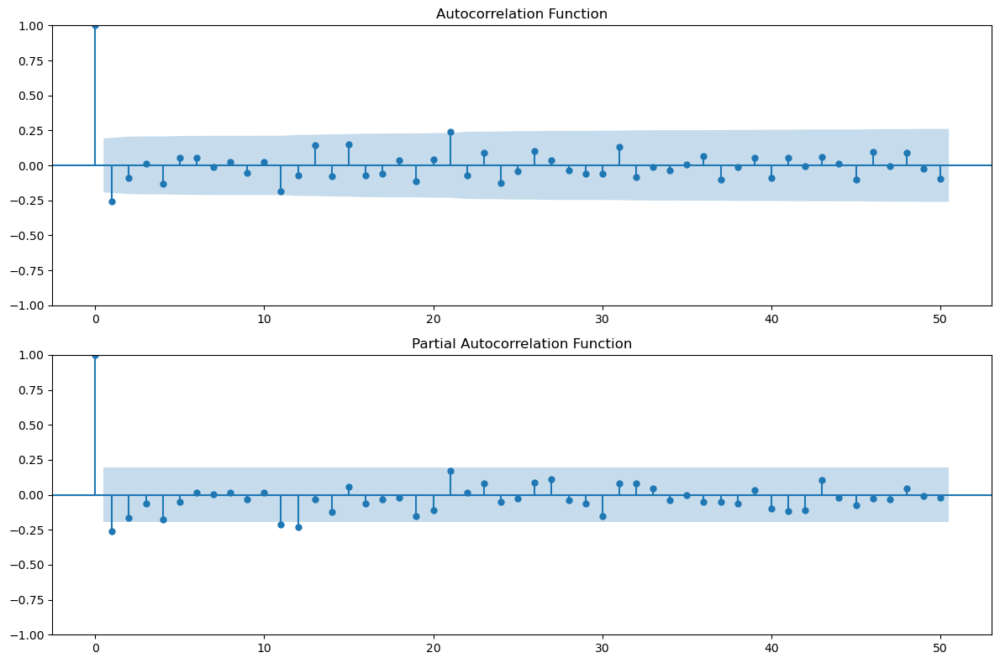

In [47]:
#ACF and PACF
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,8))

sm.graphics.tsa.plot_acf(differenced_data['VIX'], lags=50, ax=ax1)
ax1.set_title('Autocorrelation Function')

sm.graphics.tsa.plot_pacf(differenced_data['VIX'], lags=50, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()


In [48]:
log_data = np.log1p(data_clean)

In [49]:
#Determine p, d, q values
def determine_p_d_q_values(timeseries, lags):
    #Calculate autocorrelation and partial autocorrelation values
    acf_values = acf(timeseries, nlags=lags)
    pacf_values = pacf(timeseries, nlags=lags)

    #Determine value of p
    p = 0
    for i in range(1, len(acf_values)):
        if abs(acf_values[i]) > 1.96 / len(timeseries) ** 0.5: #threshold for statistical significance of autocorrelation at 95% confidence level
                                                                #Crtical value for 95% confidence level in standard normal distribution = 1.96 
                                                                #Standard error of autocorrelation = 1.95*(1/sqrt(N)) for large samples
            p = i
            break

    #Determine value of d
    d = 0
    p_value_adf = adfuller(timeseries)[1]
    while p_value_adf > 0.05:
        timeseries = np.diff(timeseries)
        d += 1
        p_value_adf = adfuller(timeseries)[1]

    #Determine value of q
    q = 0
    for i in range(1, len(pacf_values)):
        if abs(pacf_values[i]) > 1.96 / len(timeseries) ** 0.5:
            q = i
            break

    return p, d, q

In [50]:
lags = 50
timeseries = log_data.iloc[:, 0]
exogenous_variables = log_data.iloc[:, 1:]

In [51]:
#Manual determination of p, d, q
p, d, q = determine_p_d_q_values(timeseries, lags)
print(f'p: {p}, d: {d}, q: {q}')

p: 1, d: 0, q: 1


In [52]:
from pmdarima import auto_arima

In [53]:
#Determine p,d,q using auto_arima
auto_arima_model = auto_arima(timeseries, 
                              exogenous=exogenous_variables,
                              start_p=1, start_q=1, 
                              test='adf',
                              max_p=5, max_q=5,
                              m=12, #VIX data = monthly data with yearly seasonality
                              d=None,
                              seasonal=True,
                              start_P=1, start_Q=1,
                              D=None,
                              trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True
                              )

print(auto_arima_model.order)
print(auto_arima_model.seasonal_order)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-45.569, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-39.711, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-41.242, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-44.976, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-41.711, Time=0.02 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=-47.016, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-46.096, Time=0.12 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=-45.934, Time=0.88 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=-46.201, Time=0.23 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=-43.968, Time=1.30 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=-42.140, Time=0.11 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=-45.020, Time=0.33 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=-44.945, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-39.755, Time=0.13 sec
 ARIMA(0,1,2)(0,0,1)[12] intercep

In [54]:
p, d, q =auto_arima_model.order
P, D, Q, m = auto_arima_model.seasonal_order

In [55]:
print(f'p: {p}, d: {d}, q: {q}')
print(f'\nP: {P}, D: {D}, Q: {Q}')

p: 1, d: 1, q: 1

P: 0, D: 0, Q: 1


In [56]:
#Train and Test Data
train_size=int(len(log_data)*0.8)
train_data = log_data[:train_size]
test_data = log_data[train_size:]

train_target = train_data.iloc[:, 0] #VIX
test_target = test_data.iloc[:, 0]
train_exog = train_data.iloc[:, 1:]
test_exog = test_data.iloc[:, 1:]

In [57]:
from statsmodels.tsa.arima.model import ARIMA

In [58]:
#ARIMA model
arima_model = ARIMA(train_target, order=(p, d, q))
arima_results = arima_model.fit()

log_arima_forecast_in_sample = arima_results.predict(start=0, end=len(train_target)-1)
log_arima_forecast_out_of_sample = arima_results.forecast(steps=len(test_target))

log_arima_forecast = pd.concat([log_arima_forecast_in_sample, log_arima_forecast_out_of_sample])

#Back-transform and ensure non-negativity
arima_forecast = np.exp(log_arima_forecast) 
arima_forecast = np.maximum(arima_forecast, 0)


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [59]:
arima_forecast

2014-10-01 00:00:00     1.000000
2014-11-01 00:00:00    17.530000
2014-12-01 00:00:00    14.889904
2015-01-01 00:00:00    16.234095
2015-04-01 00:00:00    19.409370
                         ...    
98                     24.114638
99                     24.114445
100                    24.114331
101                    24.114263
102                    24.114223
Name: predicted_mean, Length: 103, dtype: float64

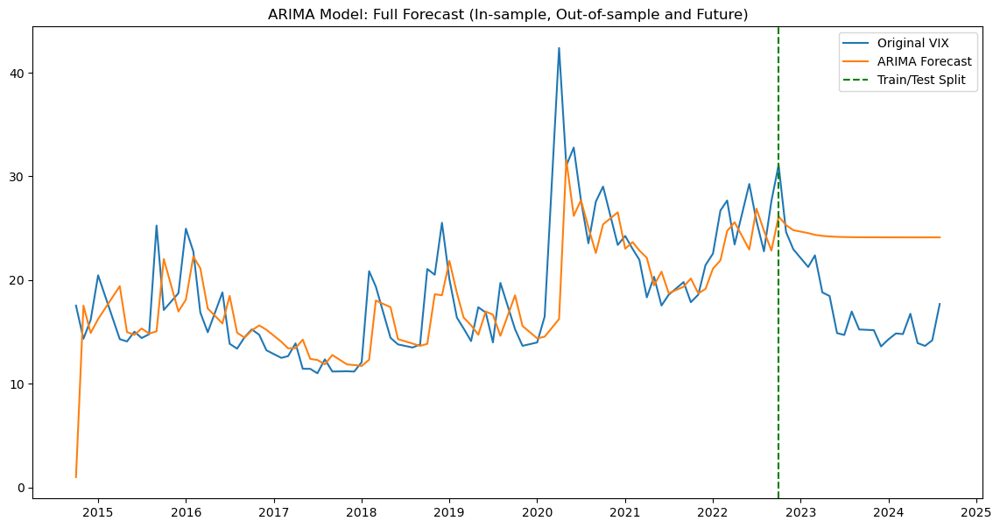

In [60]:
plt.figure(figsize=(14,7))
plt.plot(log_data.index, np.exp(log_data.iloc[:, 0]), label='Original VIX')
plt.plot(log_data.index, arima_forecast, label='ARIMA Forecast')
plt.axvline(x=log_data.index[train_size], color='green', linestyle='--', label='Train/Test Split')
plt.legend()
plt.title('ARIMA Model: Full Forecast (In-sample, Out-of-sample and Future)')
plt.show()

In [61]:
arima_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                    VIX   No. Observations:                   82
Model:                 ARIMA(1, 1, 1)   Log Likelihood                  16.432
Date:                Wed, 20 Nov 2024   AIC                            -26.865
Time:                        13:54:44   BIC                            -19.681
Sample:                             0   HQIC                           -23.983
                                 - 82                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5947      0.202      2.945      0.003       0.199       0.990
ma.L1         -0.8926      0.113     -7.896      0.000      -1.114      -0.671
sigma2         0.0388      0.003     12.590      0.000       0.033       0.045
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):               147.40
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):               1.43   Skew:                             1.80
Prob(H) (two-sided):                  0.36   Kurtosis:                         8.54
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

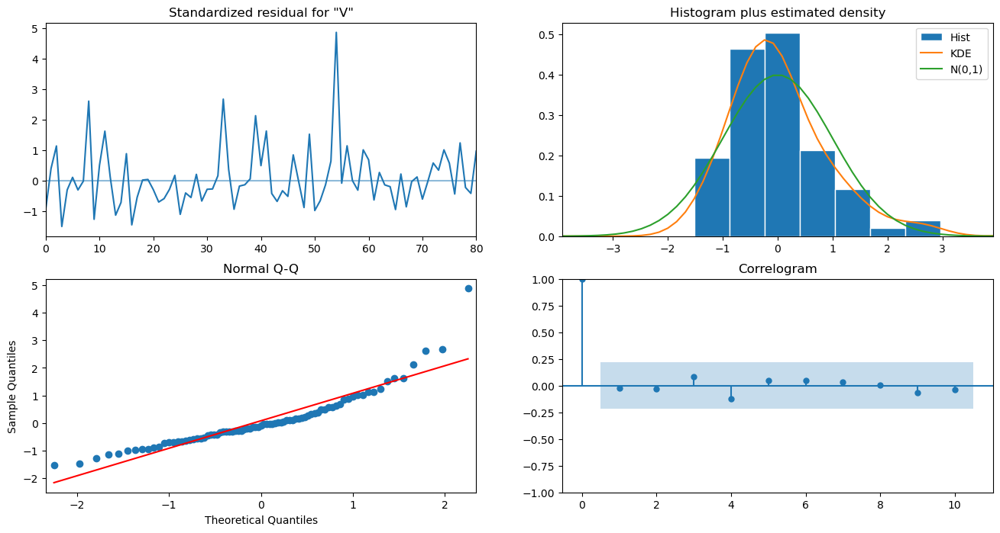

In [62]:
arima_results.plot_diagnostics(figsize=(16,8))
plt.show()

In [63]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [64]:
#ARIMAX model
arimax_model = SARIMAX(train_target, exog=train_exog, order=(p, d, q))
arimax_results = arimax_model.fit()

log_arimax_forecast_in_sample = arimax_results.predict(start=0, end=len(train_target)-1, exog=train_exog)
log_arimax_forecast_out_of_sample = arimax_results.forecast(steps=len(test_target), exog=test_exog)

log_arimax_forecast = pd.concat([log_arimax_forecast_in_sample, log_arimax_forecast_out_of_sample])

arimax_forecast = np.exp(log_arimax_forecast)
arimax_forecast = np.maximum(arimax_forecast, 0)

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
 This

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           29     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.42158D-01    |proj g|=  5.09476D-01

At iterate    5    f= -9.42689D-01    |proj g|=  3.31176D-03

At iterate   10    f= -9.42693D-01    |proj g|=  3.48948D-02

At iterate   15    f= -9.42694D-01    |proj g|=  8.71291D-03

At iterate   20    f= -9.42695D-01    |proj g|=  8.23593D-03

At iterate   25    f= -9.42695D-01    |proj g|=  6.14575D-03

At iterate   30    f= -9.42696D-01    |proj g|=  5.95061D-03

At iterate   35    f= -9.42697D-01    |proj g|=  9.41958D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


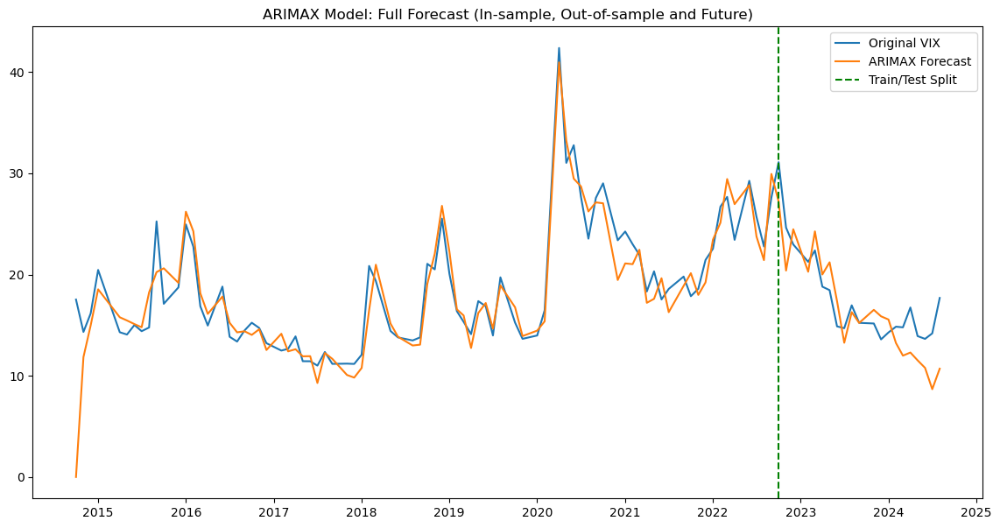

In [65]:
plt.figure(figsize=(14,7))
plt.plot(log_data.index, np.exp(log_data.iloc[:, 0]), label='Original VIX')
plt.plot(log_data.index, arimax_forecast, label='ARIMAX Forecast')
plt.axvline(x=log_data.index[train_size], color='green', linestyle='--', label='Train/Test Split')
plt.legend()
plt.title('ARIMAX Model: Full Forecast (In-sample, Out-of-sample and Future)')
plt.show()

In [66]:
arimax_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                    VIX   No. Observations:                   82
Model:               SARIMAX(1, 1, 1)   Log Likelihood                  77.301
Date:                Wed, 20 Nov 2024   AIC                            -96.602
Time:                        13:54:46   BIC                            -27.163
Sample:                             0   HQIC                           -68.742
                                 - 82                                         
Covariance Type:                  opg                                         
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
Unemployment Rate                          -0.2836      0.283     -1.002      0.317      -0.839       0.271
CPI                                         4.6321      5.005      0.926      0.355      -5.177      14.441
Three Month T Bill Rate                    -0.7345      0.757     -0.971      0.332      -2.218       0.749
Six Month T Bill Rate                       0.9878      0.719      1.374      0.169      -0.421       2.397
10-Year Treasury Constant Maturity Rate     0.9151      0.404      2.263      0.024       0.122       1.708
Fed Rate                                   -0.3766      0.439     -0.858      0.391      -1.237       0.484
BBB Rate                                   -0.7621      0.716     -1.064      0.287      -2.166       0.641
SP500 Index                                -2.8104      0.795     -3.534      0.000      -4.369      -1.252
SP500 Volume                               -2.4373      2.352     -1.036      0.300      -7.047       2.172
NASDAQ Adj Close                            0.7204      0.613      1.176      0.240      -0.481       1.921
NASDAQ Volume                               0.3847      0.240      1.606      0.108      -0.085       0.854
DJI Adj Close                               1.2015      0.923      1.302      0.193      -0.607       3.010
DJI Volume                                  0.1296      0.118      1.099      0.272      -0.102       0.361
RUSSELL2000 Adj Close                      -0.9823      0.659     -1.490      0.136      -2.275       0.310
RUSSELL2000 Volume                          1.9783      2.332      0.848      0.396      -2.593       6.549
FTSE Adj Close                             -1.7320      0.709     -2.442      0.015      -3.122      -0.342
FTSE Volume                                 0.1245      0.136      0.912      0.362      -0.143       0.392
NIKKEI Adj Close                           -0.4894      0.547     -0.895      0.371      -1.561       0.582
NIKKEI Volume                              -0.0202      0.131     -0.154      0.877      -0.276       0.236
GDP                                        -1.8557      1.584     -1.172      0.241      -4.960       1.249
Initial Claims                              0.0493      0.089      0.551      0.581      -0.126       0.224
JPY/USD Spot Rate                          -2.3354      0.785     -2.975      0.003      -3.874      -0.797
Spot Crude Oil Price                       -0.3842      0.186     -2.063      0.039      -0.749      -0.019
GOLD Adj Close                              0.7494      0.483      1.550      0.121      -0.198       1.697
GOLD Volume                                -0.0061      0.006     -0.990      0.322      -0.018       0.006
USD INDEX Adj Close                         2.7584      1.109      2.488      0.013       0.585       4.931
ar.L1                                       0.0028     32.362   8.58e-05      1.000     -63.426      63.432
m

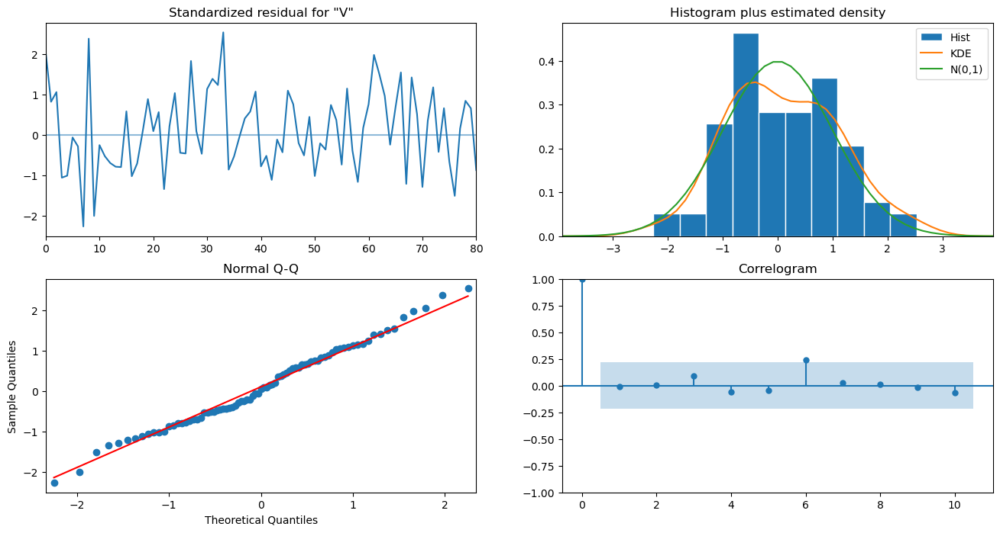

In [67]:
arimax_results.plot_diagnostics(figsize=(16,8))
plt.show()

In [68]:
from arch import arch_model

In [90]:
#ARIMAX-GARCH model
arimax_residuals = arimax_results.resid  

garch_model = arch_model(arimax_residuals, vol='GARCH', p=4, q=5)
garch_results = garch_model.fit()

garch_forecast = garch_results.forecast(horizon=len(log_arimax_forecast))
garch_variance = garch_forecast.variance.values[-1, :]

Iteration:      1,   Func. Count:     13,   Neg. LLF: 829723527.4415033
Iteration:      2,   Func. Count:     28,   Neg. LLF: 8830246.279877298
Iteration:      3,   Func. Count:     41,   Neg. LLF: 957854051.0149596
Iteration:      4,   Func. Count:     55,   Neg. LLF: 227588.84114860848
Iteration:      5,   Func. Count:     68,   Neg. LLF: 9442.04791617584
Iteration:      6,   Func. Count:     81,   Neg. LLF: 35.84529889753396
Iteration:      7,   Func. Count:     93,   Neg. LLF: 1690.5849447483297
Iteration:      8,   Func. Count:    109,   Neg. LLF: 2020934.3621160397
Iteration:      9,   Func. Count:    122,   Neg. LLF: 1333143.3898489764
Iteration:     10,   Func. Count:    135,   Neg. LLF: 1381386.5014878064
Iteration:     11,   Func. Count:    148,   Neg. LLF: 605107.4932667515
Iteration:     12,   Func. Count:    161,   Neg. LLF: 322728.4318151127
Iteration:     13,   Func. Count:    174,   Neg. LLF: -31.0374841559818
Iteration:     14,   Func. Count:    187,   Neg. LLF: 285468

In [91]:
#Combine ARIMAX mean forecast with GARCH volatility
arimax_garch_forecast = np.exp(log_arimax_forecast + np.sqrt(garch_variance) * np.random.standard_normal(len(log_arimax_forecast)))
arimax_garch_forecast = np.maximum(arimax_garch_forecast, 0)

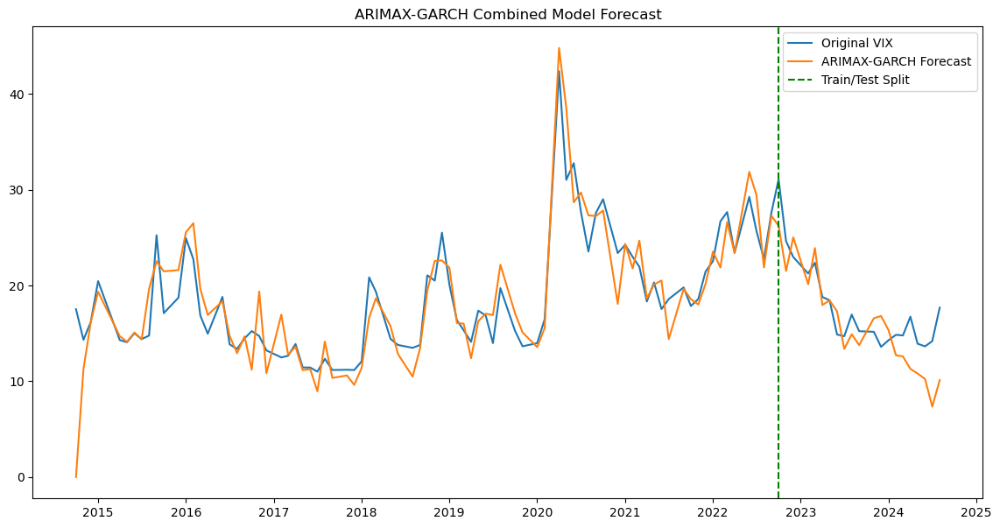

In [92]:
plt.figure(figsize=(14,7))
plt.plot(log_data.index, np.exp(log_data.iloc[:, 0]), label='Original VIX')
plt.plot(log_data.index, arimax_garch_forecast, label='ARIMAX-GARCH Forecast')

# plt.fill_between(log_data.index, 
#                  arimax_garch_forecast - 1.96 * np.sqrt(garch_variance),
#                  arimax_garch_forecast + 1.96 * np.sqrt(garch_variance),
#                  alpha = 0.2, label = '95% Confidence Interval')

plt.axvline(x=log_data.index[train_size], color='green', linestyle='--', label='Train/Test Split')
plt.legend()
plt.title('ARIMAX-GARCH Combined Model Forecast')
plt.show()

In [72]:
#SARIMAX model
P=1
D=0
Q=2 #Can change later
sarimax_model = SARIMAX(train_target,
                        exog=train_exog,
                        order=(p, d, q),
                        seasonal_order=(P, D, Q, m)
                        )

sarimax_results = sarimax_model.fit()

# log_sarimax_forecast = sarimax_results.forecast(steps=len(test_target), exog=test_exog)
log_sarimax_forecast_in_sample = sarimax_results.predict(start=0, end=len(train_target)-1, exog=train_exog)
# # log_sarimax_forecast_in_sample = sarimax_results.forecast(steps=len(train_target), exog=train_exog)
log_sarimax_forecast_out_of_sample = sarimax_results.forecast(steps=len(test_target), exog=test_exog)
# log_sarimax_forecast_out_of_sample = sarimax_results.predict(start=0, end=len(test_target)-1, exog=test_exog)


log_sarimax_forecast = pd.concat([log_sarimax_forecast_in_sample, log_sarimax_forecast_out_of_sample])

sarimax_forecast = np.exp(log_sarimax_forecast)
sarimax_forecast = np.maximum(sarimax_forecast, 0)

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/opt/

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           32     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.42509D-01    |proj g|=  5.01687D-01

At iterate    5    f= -9.43975D-01    |proj g|=  4.45249D-01

At iterate   10    f= -9.53600D-01    |proj g|=  4.97538D-02

At iterate   15    f= -9.56005D-01    |proj g|=  3.54743D-01

At iterate   20    f= -9.56836D-01    |proj g|=  4.31111D-01

At iterate   25    f= -9.58624D-01    |proj g|=  1.96341D-01

At iterate   30    f= -9.60263D-01    |proj g|=  9.70344D-02

At iterate   35    f= -9.61924D-01    |proj g|=  1.27196D-01

At iterate   40    f= -9.63659D-01    |proj g|=  1.02641D-01

At iterate   45    f= -9.64776D-01    |proj g|=  1.60775D-01

At iterate   50    f= -9.66127D-01    |proj g|=  2.28361D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


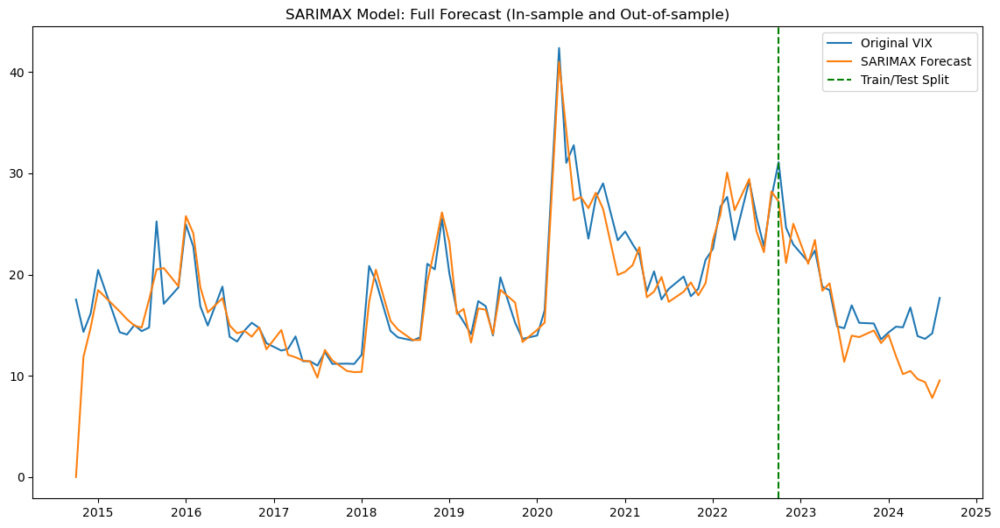

In [73]:
plt.figure(figsize=(14,7))
plt.plot(log_data.index, np.exp(log_data.iloc[:, 0]), label='Original VIX')
plt.plot(log_data.index, sarimax_forecast, label='SARIMAX Forecast')
plt.axvline(x=log_data.index[train_size], color='green', linestyle='--', label='Train/Test Split')
plt.legend()
plt.title('SARIMAX Model: Full Forecast (In-sample and Out-of-sample)')
plt.show()

In [74]:
sarimax_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                     VIX   No. Observations:                   82
Model:             SARIMAX(1, 1, 1)x(1, 0, [1, 2], 12)   Log Likelihood                  79.222
Date:                                 Wed, 20 Nov 2024   AIC                            -94.445
Time:                                         13:54:54   BIC                            -17.822
Sample:                                              0   HQIC                           -63.703
                                                  - 82                                         
Covariance Type:                                   opg                                         
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
Unemployment Rate                          -0.0834      0.290     -0.288      0.773      -0.651       0.484
CPI                                         4.6333      5.593      0.828      0.407      -6.328      15.595
Three Month T Bill Rate                    -0.8313      0.846     -0.983      0.326      -2.490       0.827
Six Month T Bill Rate                       0.9412      0.816      1.154      0.249      -0.657       2.540
10-Year Treasury Constant Maturity Rate     0.8552      0.529      1.616      0.106      -0.182       1.893
Fed Rate                                   -0.2036      0.536     -0.380      0.704      -1.253       0.846
BBB Rate                                   -0.8158      0.756     -1.079      0.281      -2.298       0.667
SP500 Index                                -2.8113      0.855     -3.288      0.001      -4.487      -1.136
SP500 Volume                               -2.4719      2.255     -1.096      0.273      -6.892       1.948
NASDAQ Adj Close                            0.7893      0.744      1.061      0.289      -0.668       2.247
NASDAQ Volume                               0.4139      0.212      1.957      0.050      -0.001       0.828
DJI Adj Close                               1.2626      0.961      1.313      0.189      -0.622       3.147
DJI Volume                                  0.1540      0.114      1.349      0.177      -0.070       0.378
RUSSELL2000 Adj Close                      -1.1466      0.663     -1.730      0.084      -2.446       0.153
RUSSELL2000 Volume                          1.9347      2.239      0.864      0.388      -2.454       6.323
FTSE Adj Close                             -1.8705      0.809     -2.313      0.021      -3.455      -0.286
FTSE Volume                                 0.1565      0.152      1.027      0.304      -0.142       0.455
NIKKEI Adj Close                           -0.3073      0.522     -0.588      0.556      -1.331       0.716
NIKKEI Volume                              -0.0480      0.140     -0.342      0.732      -0.323       0.227
GDP                                        -1.7997      1.871     -0.962      0.336      -5.468       1.868
Initial Claims                              0.0146      0.085      0.173      0.863      -0.151       0.180
JPY/USD Spot Rate                          -2.2836      0.873     -2.617      0.009      -3.994      -0.573
Spot Crude Oil Price                       -0.3179      0.196     -1.626      0.104      -0.701       0.065
GOLD Adj Close                              0.5982      0.480      1.246      0.213      -0.343       1.539
GOLD Volume                                -0.0043      0.006     -0.715      0.475      -0.016       0.007
USD INDEX Adj Close                         2.7920      1.174   

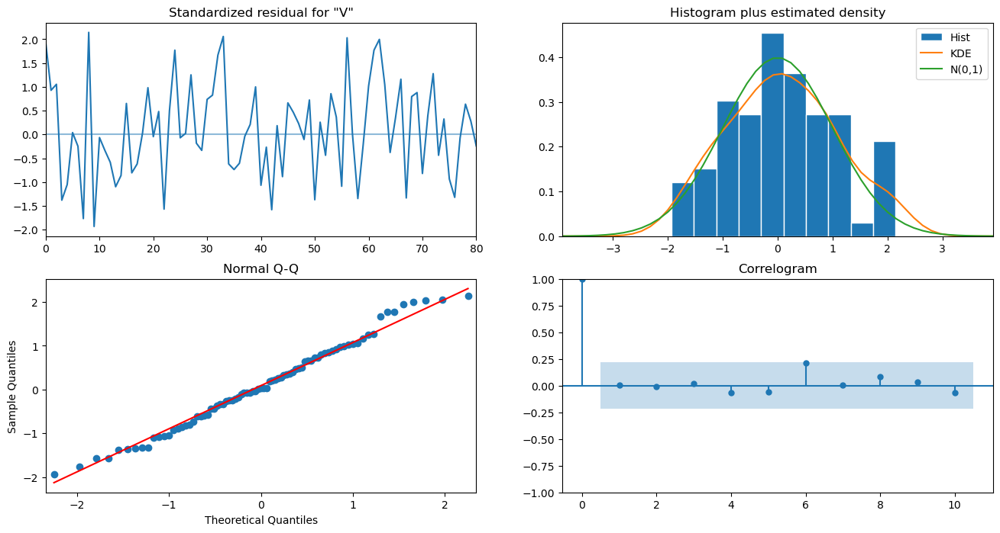

In [75]:
sarimax_results.plot_diagnostics(figsize=(16,8))
plt.show()

In [98]:
#SARIMAX-GARCH model
sarimax_residuals = sarimax_results.resid  

garch_model_2 = arch_model(sarimax_residuals, vol='GARCH', p=4, q=5)
garch_results_2 = garch_model_2.fit()

garch_forecast_2 = garch_results_2.forecast(horizon=len(log_sarimax_forecast))
garch_variance_2 = garch_forecast_2.variance.values[-1, :]

Iteration:      1,   Func. Count:     13,   Neg. LLF: 800440294.8723345
Iteration:      2,   Func. Count:     28,   Neg. LLF: 8787256.662420291
Iteration:      3,   Func. Count:     41,   Neg. LLF: 655839237.8915468
Iteration:      4,   Func. Count:     55,   Neg. LLF: 198133.83241958453
Iteration:      5,   Func. Count:     68,   Neg. LLF: 1067616.9022736873
Iteration:      6,   Func. Count:     81,   Neg. LLF: 0.6337480532317188
Iteration:      7,   Func. Count:     93,   Neg. LLF: 23864.466505846583
Iteration:      8,   Func. Count:    106,   Neg. LLF: 902144.9252450543
Iteration:      9,   Func. Count:    119,   Neg. LLF: 464.8420038413697
Iteration:     10,   Func. Count:    135,   Neg. LLF: 56128069.96404717
Iteration:     11,   Func. Count:    150,   Neg. LLF: 8612230.349802062
Iteration:     12,   Func. Count:    163,   Neg. LLF: 116313.2418340567
Iteration:     13,   Func. Count:    176,   Neg. LLF: 183472.4505795291
Iteration:     14,   Func. Count:    189,   Neg. LLF: 182781

In [ ]:
#Combine SARIMAX mean forecast with GARCH volatility
sarimax_garch_forecast = np.exp(log_sarimax_forecast + np.sqrt(garch_variance_2) * np.random.standard_normal(len(log_sarimax_forecast)))
sarimax_garch_forecast = np.maximum(sarimax_garch_forecast, 0)

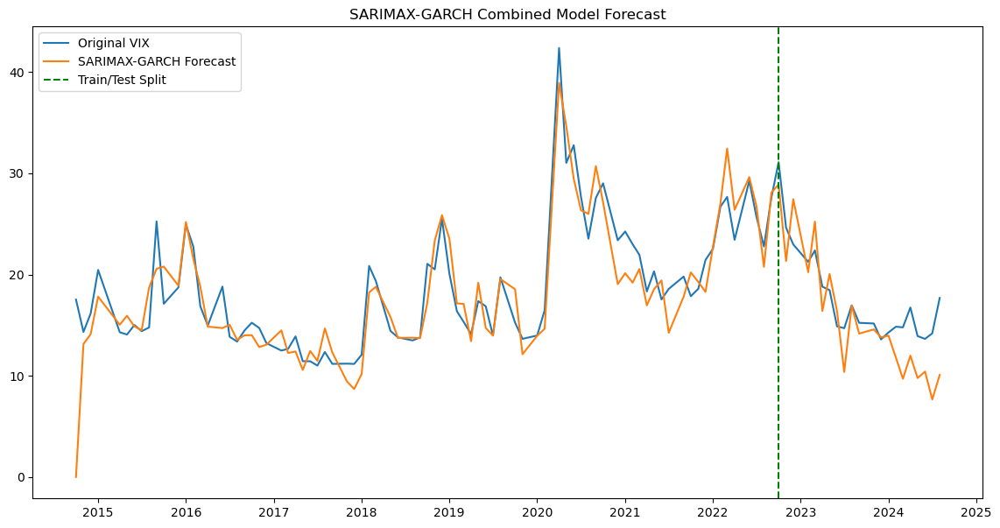

In [100]:
plt.figure(figsize=(14,7))
plt.plot(log_data.index, np.exp(log_data.iloc[:, 0]), label='Original VIX')
plt.plot(log_data.index, sarimax_garch_forecast, label='SARIMAX-GARCH Forecast')

plt.axvline(x=log_data.index[train_size], color='green', linestyle='--', label='Train/Test Split')
plt.legend()
plt.title('SARIMAX-GARCH Combined Model Forecast')
plt.show()

In [101]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, root_mean_squared_error

In [102]:
mse_arima = mean_squared_error(VIX, arima_forecast)
mse_arimax = mean_squared_error(VIX, arimax_forecast)
mse_sarimax = mean_squared_error(VIX, sarimax_forecast)
mse_arimax_garch = mean_squared_error(VIX, arimax_garch_forecast)
mse_sarimax_garch = mean_squared_error(VIX, sarimax_garch_forecast)

mape_arima = mean_absolute_percentage_error(VIX, arima_forecast)
mape_arimax = mean_absolute_percentage_error(VIX, arimax_forecast)
mape_sarimax = mean_absolute_percentage_error(VIX, sarimax_forecast)
mape_arimax_garch = mean_absolute_percentage_error(VIX, arimax_garch_forecast)
mape_sarimax_garch = mean_absolute_percentage_error(VIX, sarimax_garch_forecast)

r2_arima = r2_score(VIX, arima_forecast)
r2_arimax = r2_score(VIX, arimax_forecast)
r2_sarimax = r2_score(VIX, sarimax_forecast)
r2_arimax_garch = r2_score(VIX, arimax_garch_forecast)
r2_sarimax_garch = r2_score(VIX, sarimax_garch_forecast)

rmse_arima = root_mean_squared_error(VIX, arima_forecast)
rmse_arimax = root_mean_squared_error(VIX, arimax_forecast)
rmse_sarimax = root_mean_squared_error(VIX, sarimax_forecast)
rmse_arimax_garch = root_mean_squared_error(VIX, arimax_garch_forecast)
rmse_sarimax_garch = root_mean_squared_error(VIX, sarimax_garch_forecast)

In [103]:
def mean_directional_accuracy(actual, predicted):
    actual = np.array(actual)
    predicted = np.array(predicted)
    
    # Calculate the signs of the differences between consecutive values
    actual_diff = np.diff(actual)
    actual_signs = np.sign(actual_diff)
    predicted_diff = np.diff(predicted)
    predicted_signs = np.sign(predicted_diff)
    
    # Count the number of times the signs are the same
    num_correct = np.sum(actual_signs == predicted_signs)
    
    # Calculate the MDA value
    mda = num_correct / (len(actual) - 1)
    
    return mda

In [104]:
da_arima = mean_directional_accuracy(VIX.iloc[0:, 0], arima_forecast)
da_arimax = mean_directional_accuracy(VIX.iloc[0:, 0], arimax_forecast)
da_sarimax = mean_directional_accuracy(VIX.iloc[0:, 0], sarimax_forecast)
da_arimax_garch = mean_directional_accuracy(VIX.iloc[0:, 0], arimax_garch_forecast)
da_sarimax_garch = mean_directional_accuracy(VIX.iloc[0:, 0], sarimax_garch_forecast)

In [105]:
print('ARIMA:')
print(f' MSE : {mse_arima} \n MAPE: {mape_arima} \n R2 Score : {r2_arima} \n RMSE : {rmse_arima} \n Directon Accuracy : {da_arima}')

print('\nARIMAX:')
print(f' MSE : {mse_arimax} \n MAPE: {mape_arimax} \n R2 Score : {r2_arimax} \n RMSE : {rmse_arimax} \n Directon Accuracy : {da_arimax}')

print('\nSARIMAX:')
print(f' MSE : {mse_sarimax} \n MAPE: {mape_sarimax} \n R2 Score : {r2_sarimax} \n RMSE : {rmse_sarimax} \n Directon Accuracy : {da_sarimax}')

print('\nARIMAX-GARCH:')
print(f' MSE : {mse_arimax_garch} \n MAPE: {mape_arimax_garch} \n R2 Score : {r2_arimax_garch} \n RMSE : {rmse_arimax_garch} \n Directon Accuracy : {da_arimax_garch}')

print('\nSARIMAX-GARCH:')
print(f' MSE : {mse_sarimax_garch} \n MAPE: {mape_sarimax_garch} \n R2 Score : {r2_sarimax_garch} \n RMSE : {rmse_sarimax_garch} \n Directon Accuracy : {da_sarimax_garch}')


ARIMA:
 MSE : 32.05190147059787 
 MAPE: 0.251229189301615 
 R2 Score : 0.009135171247891094 
 RMSE : 5.661439876091405 
 Directon Accuracy : 0.49019607843137253

ARIMAX:
 MSE : 7.271445233138149 
 MAPE: 0.11322840420429815 
 R2 Score : 0.7752077410345486 
 RMSE : 2.6965617428752022 
 Directon Accuracy : 0.7352941176470589

SARIMAX:
 MSE : 7.616884223207623 
 MAPE: 0.11425566750079397 
 R2 Score : 0.7645287070292345 
 RMSE : 2.7598703272450362 
 Directon Accuracy : 0.7156862745098039

ARIMAX-GARCH:
 MSE : 9.974950905786638 
 MAPE: 0.1329588818903092 
 R2 Score : 0.6916305252548061 
 RMSE : 3.158314567263153 
 Directon Accuracy : 0.7254901960784313

SARIMAX-GARCH:
 MSE : 8.844226590838344 
 MAPE: 0.1296252480065706 
 R2 Score : 0.7265861722926226 
 RMSE : 2.9739244426915663 
 Directon Accuracy : 0.7058823529411765


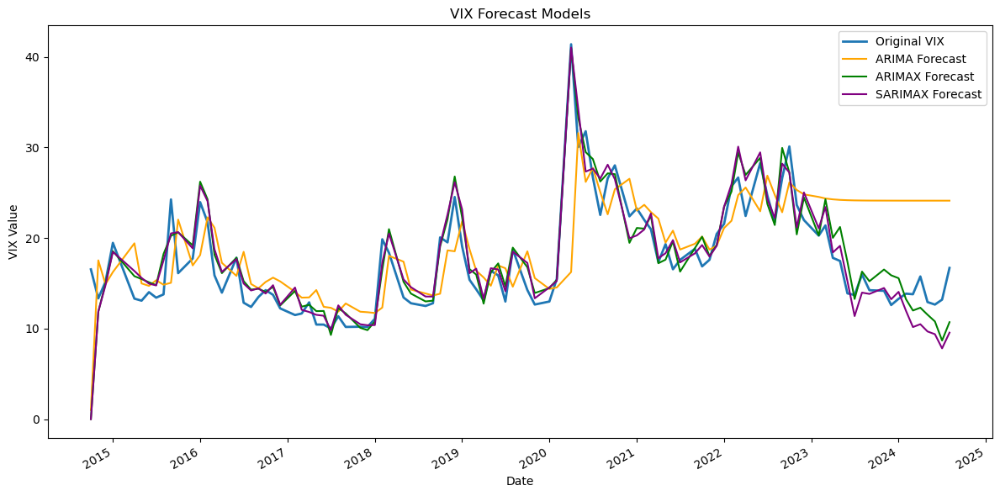

In [84]:
# Plot the model forecasts
plt.figure(figsize=(12, 6))

# Plot original VIX data
plt.plot(log_data.index, VIX, label='Original VIX', linewidth=2)

# Plot forecasts
plt.plot(log_data.index, arima_forecast, color='orange', label='ARIMA Forecast')
plt.plot(log_data.index, arimax_forecast, color='green', label='ARIMAX Forecast')
plt.plot(log_data.index, sarimax_forecast, color='purple', label='SARIMAX Forecast')

plt.legend(loc='best')
plt.title('VIX Forecast Models')
plt.xlabel('Date')
plt.ylabel('VIX Value')

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

# Use tight layout to ensure all elements fit in the figure area
plt.tight_layout()

plt.show()

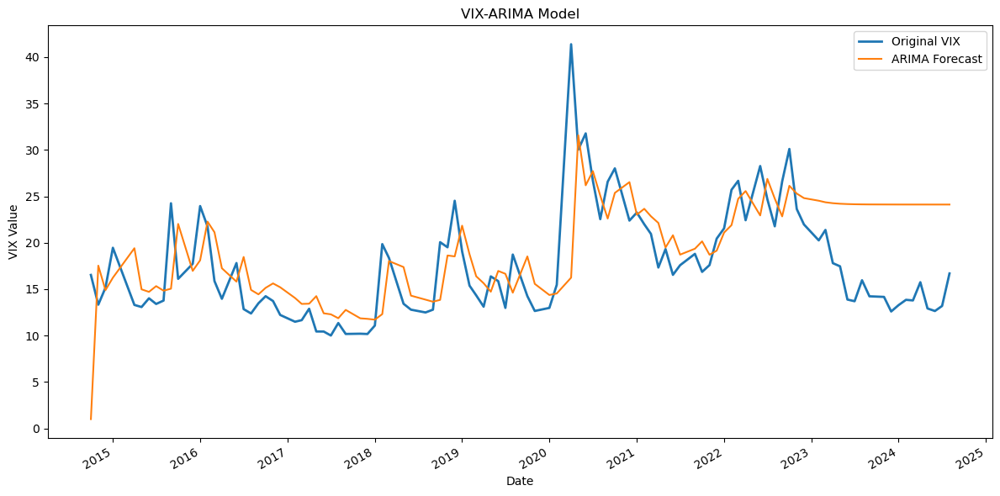

In [85]:
# Plot ARIMA
plt.figure(figsize=(12, 6))

# Plot original VIX data
plt.plot(log_data.index, VIX, label='Original VIX', linewidth=2)

# Plot forecasts
plt.plot(log_data.index, arima_forecast, label='ARIMA Forecast')

plt.legend(loc='best')
plt.title('VIX-ARIMA Model')
plt.xlabel('Date')
plt.ylabel('VIX Value')

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

# Use tight layout to ensure all elements fit in the figure area
plt.tight_layout()

plt.show()

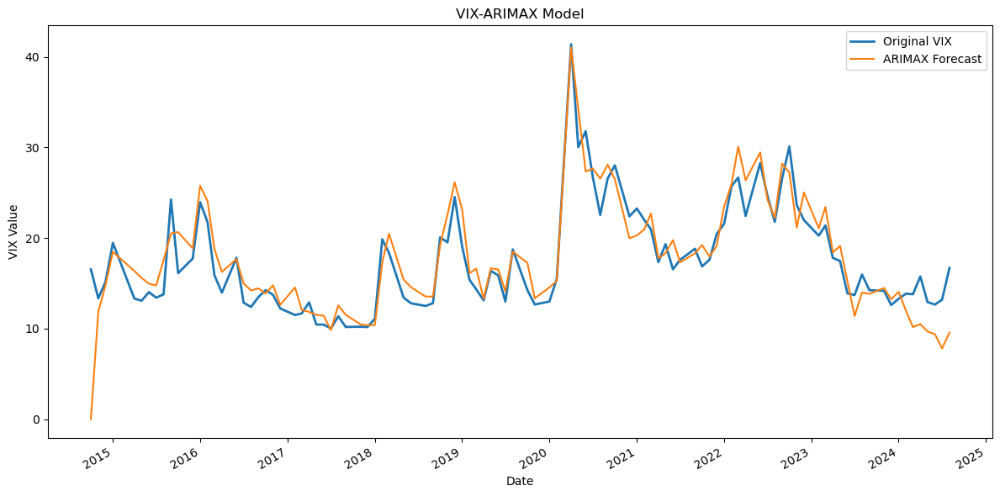

In [86]:
# Plot ARIMAX model
plt.figure(figsize=(12, 6))

# Plot original VIX data
plt.plot(log_data.index, VIX, label='Original VIX', linewidth=2)

# Plot forecasts
plt.plot(log_data.index, sarimax_forecast, label='ARIMAX Forecast')

plt.legend(loc='best')
plt.title('VIX-ARIMAX Model')
plt.xlabel('Date')
plt.ylabel('VIX Value')

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

# Use tight layout to ensure all elements fit in the figure area
plt.tight_layout()

plt.show()

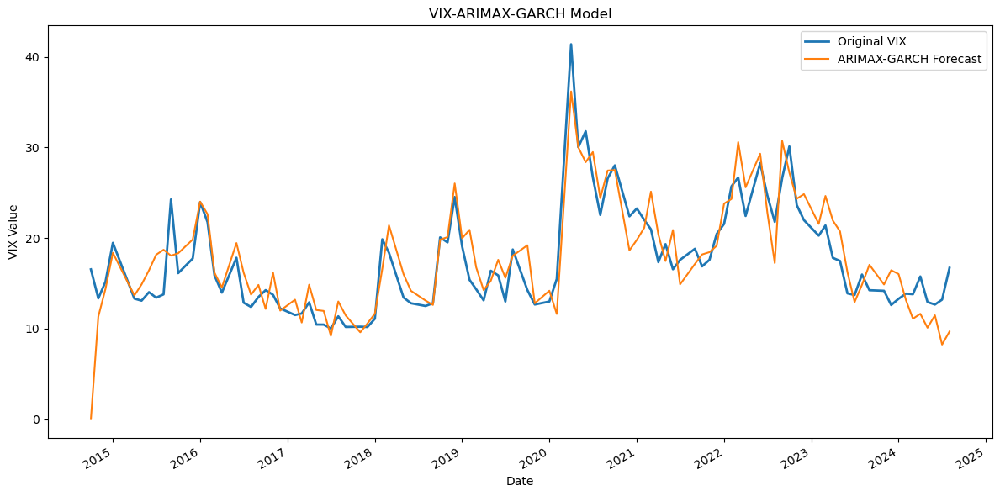

In [87]:
# Plot ARIMAX-GARCH model
plt.figure(figsize=(12, 6))

# Plot original VIX data
plt.plot(log_data.index, VIX, label='Original VIX', linewidth=2)

# Plot forecasts
plt.plot(log_data.index, arimax_garch_forecast, label='ARIMAX-GARCH Forecast')

plt.legend(loc='best')
plt.title('VIX-ARIMAX-GARCH Model')
plt.xlabel('Date')
plt.ylabel('VIX Value')

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

# Use tight layout to ensure all elements fit in the figure area
plt.tight_layout()

plt.show()

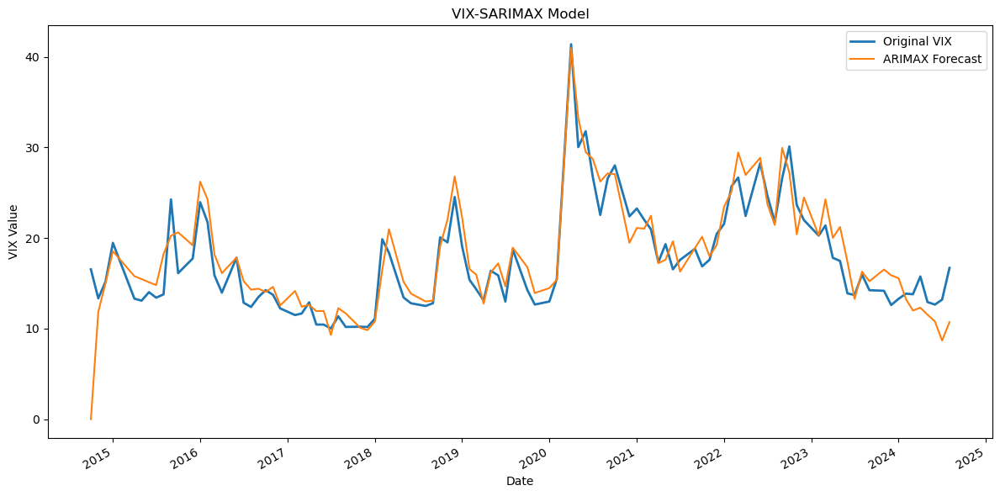

In [88]:
# Plot SARIMAX model
plt.figure(figsize=(12, 6))

# Plot original VIX data
plt.plot(log_data.index, VIX, label='Original VIX', linewidth=2)

# Plot forecasts
plt.plot(log_data.index, arimax_forecast, label='ARIMAX Forecast')

plt.legend(loc='best')
plt.title('VIX-SARIMAX Model')
plt.xlabel('Date')
plt.ylabel('VIX Value')

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

# Use tight layout to ensure all elements fit in the figure area
plt.tight_layout()

plt.show()

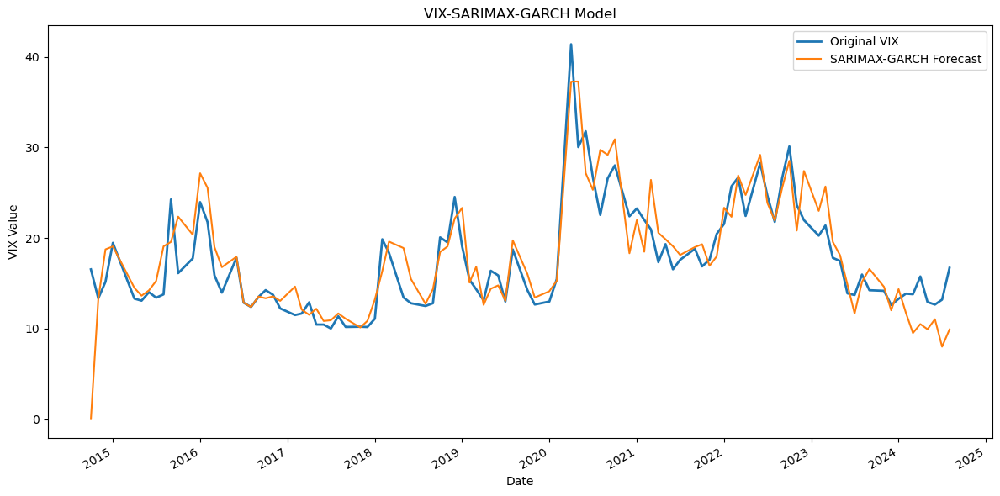

In [89]:
# Plot SARIMAX-GARCH model
plt.figure(figsize=(12, 6))

# Plot original VIX data
plt.plot(log_data.index, VIX, label='Original VIX', linewidth=2)

# Plot forecasts
plt.plot(log_data.index, sarimax_garch_forecast, label='SARIMAX-GARCH Forecast')

plt.legend(loc='best')
plt.title('VIX-SARIMAX-GARCH Model')
plt.xlabel('Date')
plt.ylabel('VIX Value')

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

# Use tight layout to ensure all elements fit in the figure area
plt.tight_layout()

plt.show()